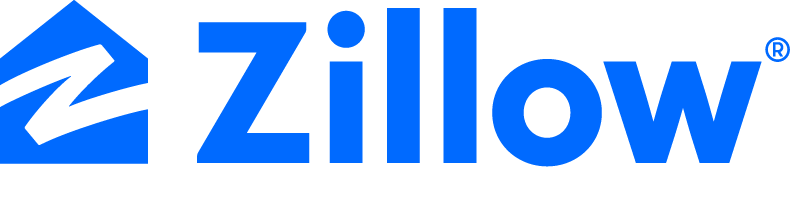

# Project Objectives

Document code, process (data acquistion, preparation, exploratory data analysis and statistical testing, modeling, and model evaluation), findings, and key takeaways in a Jupyter Notebook Final Report.

Create modules (acquire.py, prepare.py) that make your process repeateable and your report (notebook) easier to read and follow.

Ask exploratory questions of your data that will help you understand more about the attributes and drivers of home value. Answer questions through charts and statistical tests.

Construct a model to predict assessed home value for single family properties using regression techniques.

Make recommendations to a data science team about how to improve predictions.

Refine your work into a Report, in the form of a jupyter notebook, that you will walk through in a 5 minute presentation to a group of collegues and managers about the work you did, why, goals, what you found, your methdologies, and your conclusions.

Be prepared to answer panel questions about your code, process, findings and key takeaways, and model.

# Business Goals:

My goal is to find key driver for taxtotal in families property in 2017

Construct an ML Regression model that predict propery tax assessed values ('taxvaluedollarcnt') of Single Family Properties using attributes of the properties.

Find the key drivers of property value for single family properties. Some questions that come to mind are: Why do some properties have a much higher value than others when they are located so close to each other? Why are some properties valued so differently from others when they have nearly the same physical attributes but only differ in location? Is having 1 bathroom worse than having 2 bedrooms?

Deliver a report that the data science team can read through and replicate, understand what steps were taken, why and what the outcome was.

Make recommendations on what works or doesn't work in prediction these homes' values.

# Questions:

• What effect families houses values??

• Why do family house increase so much ??

• Can we stop the price increase ??

# Steps:
1-Data acquistion 

2-Preparation

3-Exploratory data analysis 

4-Modeling 

5-Model evaluation

In [24]:
import pandas as pd
import numpy as np 
import acquire
import prepare
import pandas as pd
import numpy as np
import os
import scipy.stats as stats
from sklearn.impute import SimpleImputer
import sklearn.preprocessing
# Viz imports
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
from IPython.display import IFrame

# Modeling imports
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import warnings
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor
from sklearn.preprocessing import PolynomialFeatures
warnings.filterwarnings("ignore")
# Custom module imports
import acquire
import prepare
import modeling
α = .05
alpha= .05

# 1)Acquire data: 

In [2]:
#acquire.py from sql basic version
df=acquire.sqlclean_zillow()
df.shape

(52442, 11)

# Acquire takeaways:

-total number of single families 52,442.

-number of columns 11

-acquire this from the code up servers

# 2-Preparation/split data:

In [3]:
#prepare zillow using sql in the prepare.py file
df=prepare.prep_zillow(df)

In [4]:
# splitting data into train, validate, test 60,20,20 using the prepare.py
train,val,test=prepare.my_train_test_split(df)
train.shape,val.shape,test.shape

((28264, 15), (9422, 15), (9422, 15))

In [5]:
#Creating a scaled of each split to prevent leaks and to create proper modeling.
cols_to_scale=['Bedrooms','Bathrooms','Squarefeet','TaxesTotal','Year','County','Zip','latitude',
               'longitude','TotalRooms','Decade','los_angeles', 'orange', 'ventura']
train_scaled, val_scaled, test_scaled = prepare.scale_data(train, val, test, cols_to_scale)

# Data Used-Zillow

|Attribute|Old keys|        Data type   |       Definition   |
| -------- |-------- | -------- | -------- | 
|Bedrooms |bedroomcnt|float |  Number of bedrooms in home |
|Bathrooms |bathroomcnt|float | Number of bathrooms in home including fractional bathrooms|
|Squarefeet |calculatedfinishedsquarefeet|float | Calculated total finished living area of the home |
|TaxesTotal |taxvaluedollarcnt|float|The total property tax assessed for that assessment year 
|Year |yearbuilt|float |The Year the principal residence was built  |
|county |regionidcounty |float |The total tax assessed value of the parcel|
|Zip|regionidzip|object | Federal Information Processing Standard code |
|latitude|latitude|float|cordinates
|longitude|longitude|float|cordinates
|TotalRooms|N/A|float|bathrooms and bedrooms combined 
|location|N/A|object|area houses are located in 
|Decade|N/A|int   |Years slice into half a centary|
|los_angelos|N/A|int|1 for yes and 0 for no
|orange|N/A|int|1 for yes and 0 for no
|ventura|N/A|int|1 for yes and 0 for no

# Hypotheses:
`Hypothesis(1)-Do bedrooms increase price:`

Ho-Does more Bed rooms increase the cost of the houses?

Ha-Bed rooms has no effect on pricing of house

`Hypothesis(2)-Does squarefeet effect cost of housing:`

Ho-Would the amount of squarefeet effect the cost of housing?

Ha-squarefeet as no effect on housing


`Hypothesis(3)-What decade does the market love:`

Ho-Would decade effect total cost of the house ?

Ha-Decade has no effect on total cost of market 

`Hypothesis(4)-Do Bathrooms have a big effect on pricing:`

Ho-Does more bathrooms increase the cost of the houses?

Ha-Bathrooms has no effect on pricing of house

`Hypothesis(5)-Does county have a impact on taxtotal:`

Ho-Does county have a impact on taxtotal?

Ha-county doesnt have a impact on taxtotal

# Prepare takeaways:

-created new columns name location(la,orn,va),totalrooms accounting for all rooms, and Decade split years

-county/zip is used for locations 

-year was split into decade to make graph alot better 

-took away all of the nulls

-split train,val,test into 60,20,20

# 3-Exploratory data analysis:

# `Hypothesis(1)-Do bedrooms increase price:`

Ho-Does more Bed rooms increase the cost of the houses?

Ha-Bed rooms has no effect on pricing of house

In [6]:
#modeling bedrooms with taxestotal, this wont show up on github i really like this graph too
modeling.bedrooms_price(train)

alt.VConcatChart(...)

<Figure size 360x720 with 0 Axes>

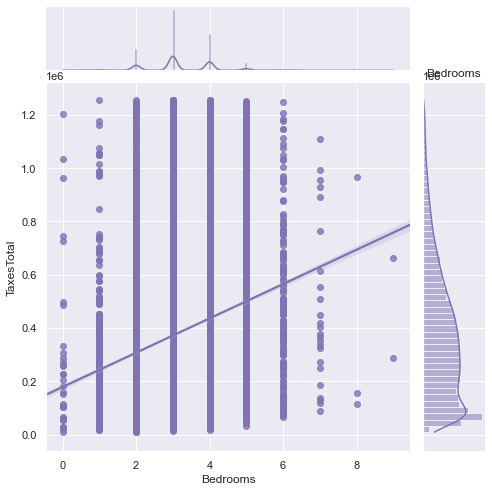

In [7]:
#modeling acquire from modeling.py import to show plot
modeling.bedrooms_price1(train)

In [8]:
#stats chi^2
modeling.test1(train)

Reject the Null Hypothesis.
    Findings suggest there is an association between bedrooms and taxestotal.


# Key takeaways:

• We could used bedrooms as a factor on why taxes total is going up

• More bedrooms the higher the taxes total

• bedrooms has a less impact then bathrooms

# `Hypothesis(2)-Does squarefeet effect cost of housing:`

Ho-Would the amount of squarefeet effect the cost of housing?

Ha-squarefeet as no effect on housing

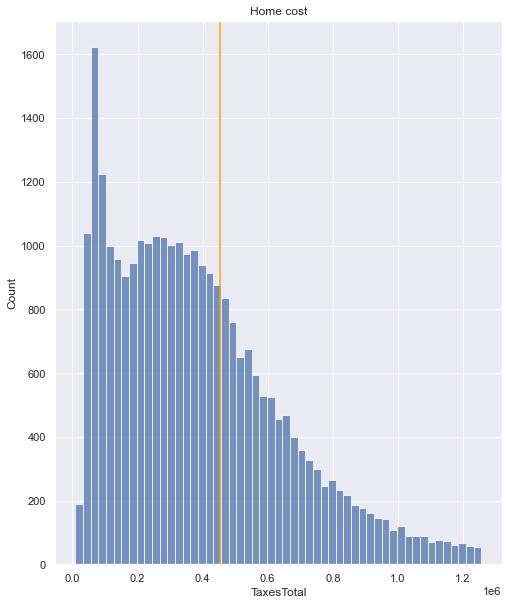

In [9]:
#modeling acquire from modeling.py import to show plot
modeling.squarefeet_taxes1(train)

<Figure size 576x720 with 0 Axes>

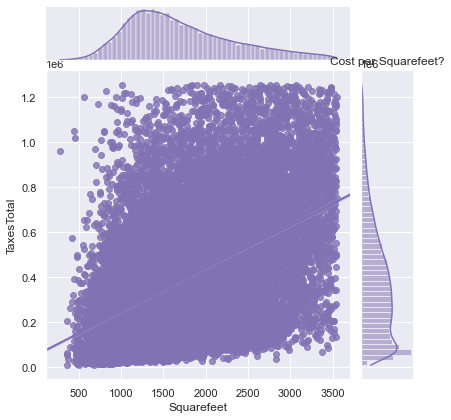

In [10]:
#modeling acquire from modeling.py import to show plot
modeling.squarefeet_taxes(train)

In [11]:
#stats chi^2
modeling.test3(train)

Reject the Null Hypothesis.
     Findings suggest there is an association between Squarefeet and taxestoal.


# Key takeaways:

• We could used squarefeet as a factor on why taxes total is going up

• I know the graph aint the bed but we could determined that more squarefeet= higher taxes total 

• Around the 800k and 1m mark houses totals start to go down but not squarefeet

# `Hypothesis(3)-What decade does the market love:`

Ho-Would decade effect total cost of the house ?

Ha-Decade has no effect on total cost of market 

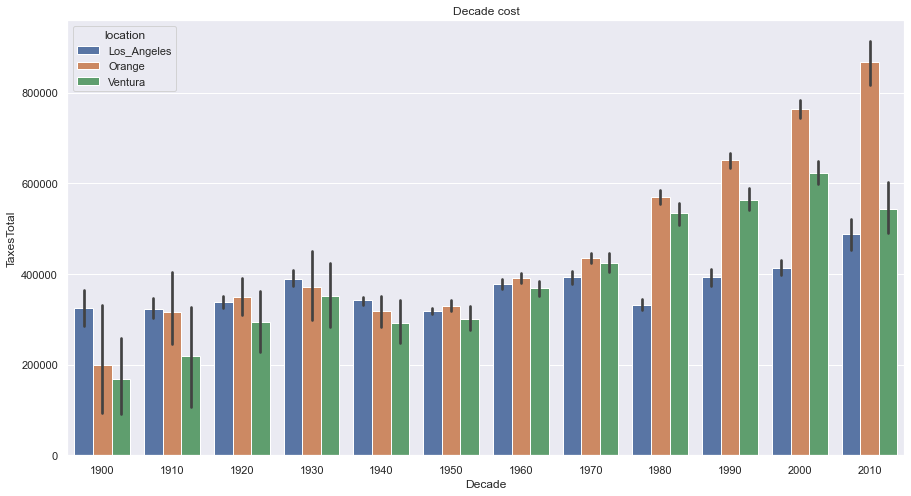

In [12]:
#modeling acquire from modeling.py import to show plot
modeling.decade_tax2(train)

<Figure size 360x720 with 0 Axes>

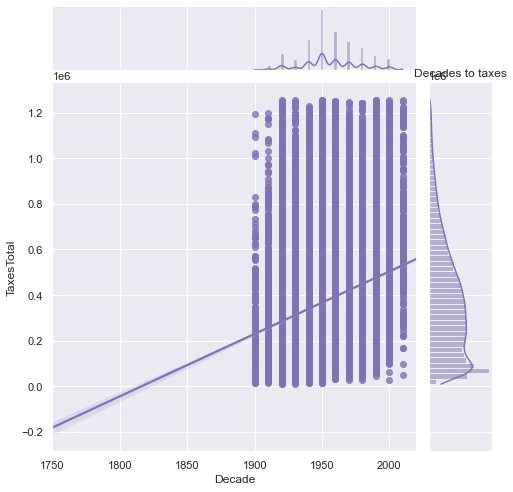

In [13]:
#modeling acquire from modeling.py import to show plot
modeling.decade_tax1(train)

In [14]:
#stats chi^2
modeling.test4(train)

Reject the Null Hypothesis.
    Findings suggest there is an association between Decade and taxestoal.


# Key takeaways:

• We could used Decade as a factor on why taxes total is going up

• higher the decade the higher the price 

• house increase by 200% from 1900 to 2010(dont wanna even see 2021 house mark )

# `Hypothesis(4)-Do Bathrooms have a big effect on pricing:`

Ho-Does more bathrooms increase the cost of the houses?

Ha-Bathrooms has no effect on pricing of house

In [15]:
#modeling acquire from modeling.py import to show plot, this wont show up on github ... i really like this one too
modeling.Bathrooms_tax(train)

alt.VConcatChart(...)

<Figure size 360x720 with 0 Axes>

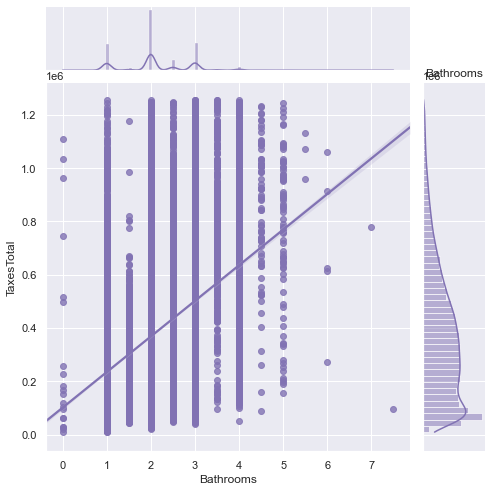

In [16]:
#modeling acquire from modeling.py import to show plot
modeling.Bathrooms_tax1(train)

In [17]:
#stats chi^2
modeling.test2(train)

Reject the Null Hypothesis.
    Findings suggest there is an association between bathrooms and taxestoal.


# key takeaways:

•We could used Bathrooms as a factor on why taxes total is going up

•Bath rooms have a higher effect on tax total then bed rooms. i dont know why

•los angeles has expensive bathrooms fancy 

# `Hypothesis(5)-Does county have a impact on taxtotal:`

Ho-Does county have a impact on taxtotal?

Ha-county doesnt have a impact on taxtotal

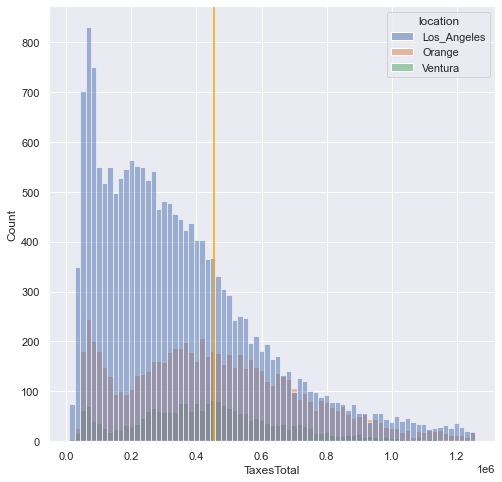

In [18]:
#modeling acquire from modeling.py import to show plot
modeling.county_tax(train)

<Figure size 360x720 with 0 Axes>

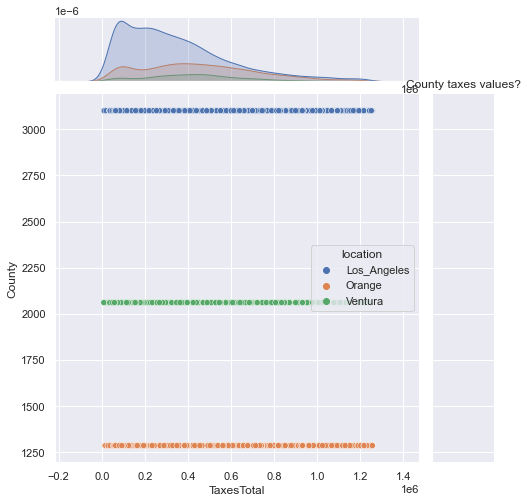

In [19]:
#modeling acquire from modeling.py import to show plot
modeling.county_tax1(train)

In [20]:
#stats chi^2
modeling.test5(train)

Reject the Null Hypothesis.
        Findings suggest there is an association between County and taxestoal.


# Key takeaways:

•We could used county as a factor on why taxes total is going up

•los angelos has the really high taxes so dont live there 

• More house in los angelos but at waht cost???

# Exploration takeaways:

• all of the following (bedrooms,bathrooms,county,location,squarefeet,decade) have a effect on taxestotal

• Some take aways might not have a big effect on taxtotal but its still there

• los angelos is expensive place for houses

• bathrooms have a bigger effect then bedrooms,i dont know why?



# 4-Modeling :

In [21]:
# Create the X and y for train, validate, and test
# Get it ready for modeling
X_train, y_train, X_val, y_val, X_test, y_test = prepare.model_setup(train_scaled, train, val_scaled, val, test_scaled, test)

In [22]:
# Get the modeling results, PolynomialFeatures, lars model
metrics = modeling.Modeling_function(X_train, y_train, X_val, y_val)
metrics

,Model,Train_rmse,Train_r2,Val_rmse,Val_r2
0,baseline_mean,261324.035242,0.000000,261430.270994,0.000000
1,Lars_alpha(2),220486.586943,0.288122,223655.138918,0.268033
2,Depth(1),220490.325968,0.288098,223670.191995,0.267934
3,Depth(2),215830.734471,0.317869,218523.795577,0.301213


# Modeling Takeaways:

• The quadratic linear regression model performed best

• Model perform with a r2 of .301

• None of these model is good enough to actual predict anything...

# 5-Model evaluation:
 
 `Best model-`The quadratic linear regression model performed best depth(2)

In [23]:
# Test the best model
modeling.modeling_best(X_train, y_train, X_val, y_val, X_test, y_test)


,test
Test_r2,0.316909
Test_rmse,215448.876010


# 

# Conclusion/Recommnedations/Next Steps:
`Conclusion:`

• We could conclude that bedrooms,bathrooms,decade,county,location,squarefeet have a effect on taxtotal

• In conclusion tax total could be effect by many columns and many things so what should we do ?

• We could conclude that the linear regression model perform the best with a r rate of .31

`Recommendations:`

•Addding more data about the areas surronding the houses for example School,Malls,parks,rivers,lakes,hills,views, and much more so would could obtain a more accurate model.

•Would love to keep the cost of something the same but when something is in high demand usually means price would increase. 

`Next Steps:`

• I would love to dive into more column in the zillow data set. How a room squarefeet could effect the house more then a basic rooom or how a garage could add more value then a pool??. This data has so much potential but i would just be digging myself into a rabbit hole.

• I would check 2018 and see how the market has change from the 2017 market of single families houses